# (12) FashionMNIST: $T \in 32, 64, 128$

project = ```iP-VAE```, host = ```mach```, device = ```cuda:2```

**Motivation**: <br>

Lienar decoder + FashionMNIST works?

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_IterativeVAE'))
from figures.convergence import plot_convergence
from figures.imgs import plot_weights
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report


device_idx = 2
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:2  ———  host: mach

## (128, 96.0)

In [3]:
a = 'poisson_FashionMNIST_t-128_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep400-lr(0.0005)_beta(96:0.1)_temp(0.01:0.5)_gr(3000)_(2025_03_15,21:26)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

400

In [4]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.0352], device='cuda:2', grad_fn=<ExpBackward0>),)

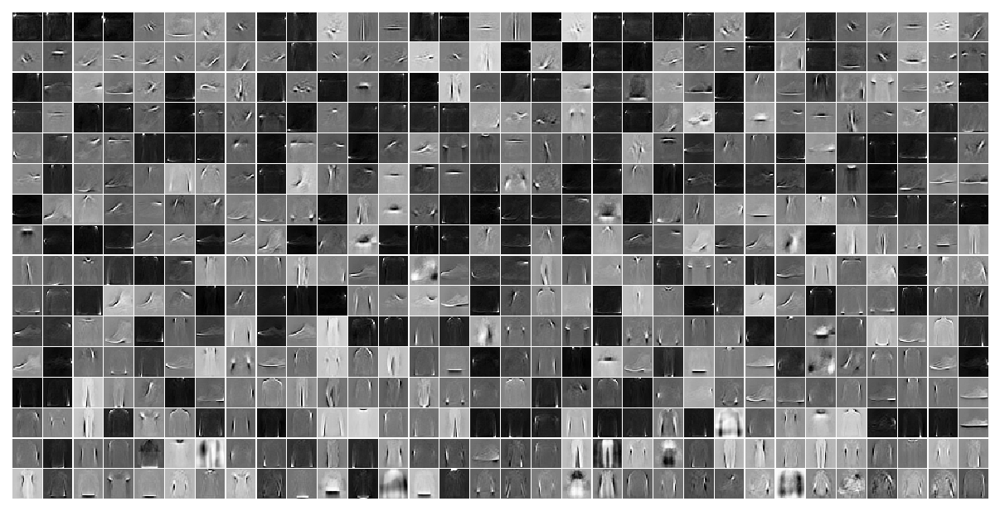

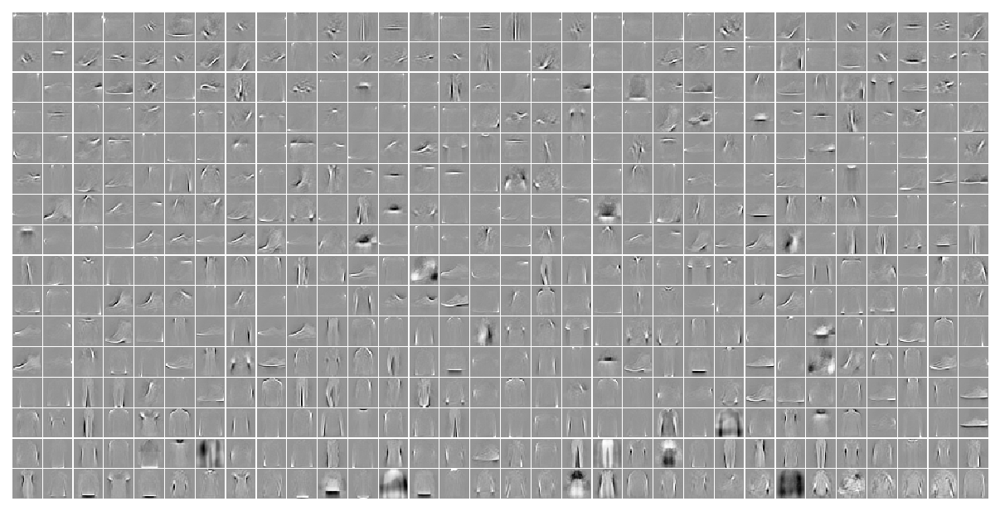

In [5]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 5/5 [02:24<00:00, 28.98s/it]


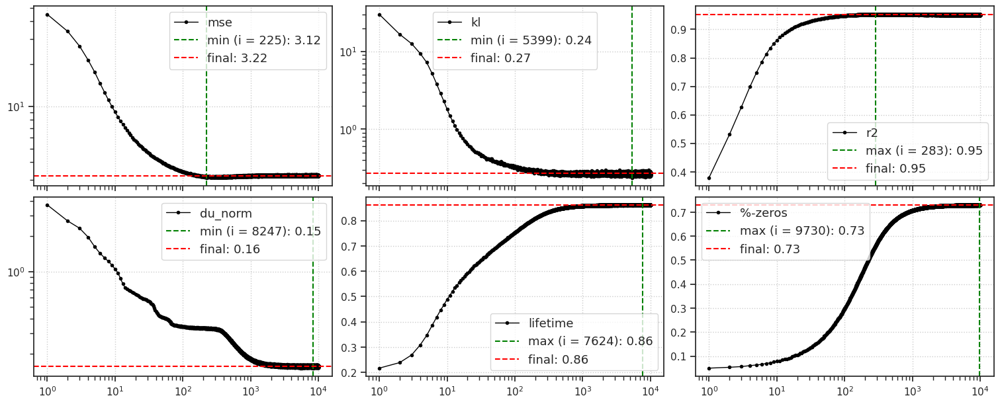

CPU times: user 2min 32s, sys: 21.3 s, total: 2min 53s
Wall time: 2min 56s


In [6]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=5,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [8]:
kws = dict(
    seq_total=1000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


In [9]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [10]:
clf = LogisticRegression(C=1.0).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [11]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.8679

In [22]:
true = tonp(tr.dl_vld.dataset.tensors[1])

accu = {}
for c in tqdm([1e-4, 1e-2, 1e-1, 5e-1, 1, 5, 50, 1e2, 1e5]):
    clf = LogisticRegression(C=c, max_iter=100, tol=1e-4).fit(
        lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))
    pred = clf.predict(lamb['vld'])
    report = classification_report(true, pred, output_dict=True)
    accu[c] = report['accuracy']

100%|█████████████████████████████████████████████| 9/9 [00:07<00:00,  1.18it/s]


In [23]:
print(accu)

{
    0.0001: 0.8671,
    0.01: 0.8696,
    0.1: 0.8682,
    0.5: 0.8679,
    1: 0.8679,
    5: 0.8678,
    50: 0.8677,
    100.0: 0.8677,
    100000.0: 0.8677
}

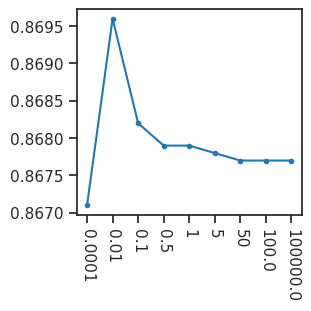

In [24]:
fig, ax = create_figure(1, 1, (3, 3))
ax.plot(list(accu.values()), marker='.')
ax.set(xticks=range(len(accu)), xticklabels=list(accu))
ax.tick_params(axis='x', rotation=-90)
plt.show()

## (128, 128.0)

In [3]:
a = 'poisson_FashionMNIST_t-128_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep400-lr(0.0005)_beta(128:0.1)_temp(0.01:0.5)_gr(2000)_(2025_03_14,19:01)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

400

In [4]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.0301], device='cuda:2', grad_fn=<ExpBackward0>),)

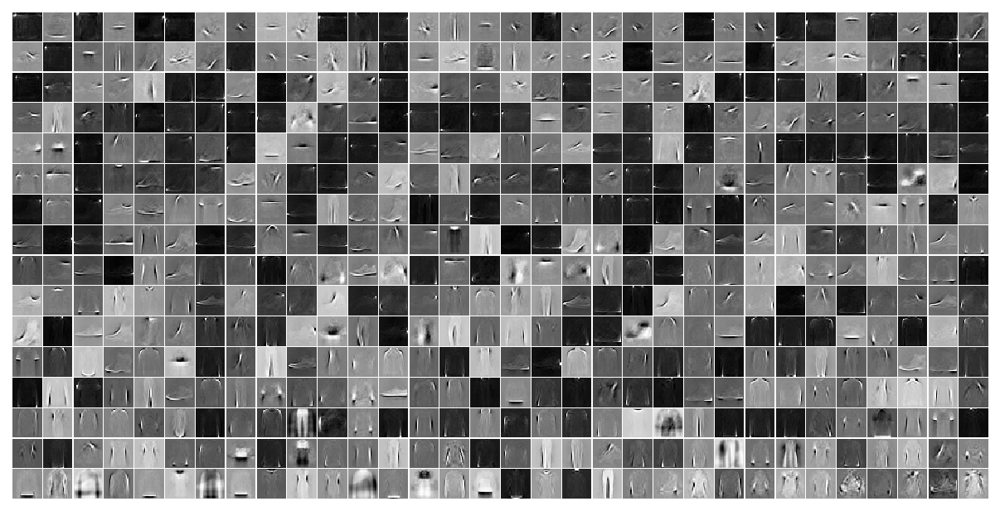

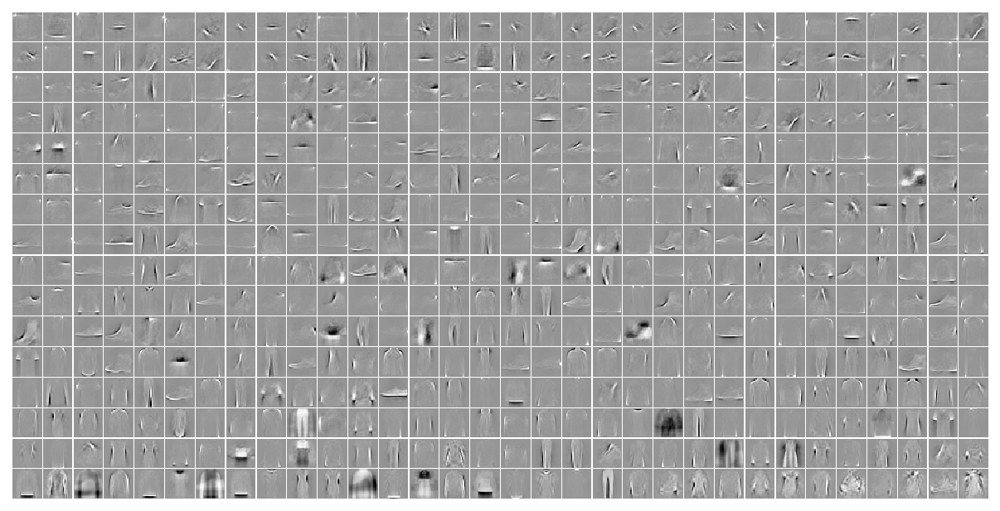

In [5]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 5/5 [02:52<00:00, 34.52s/it]


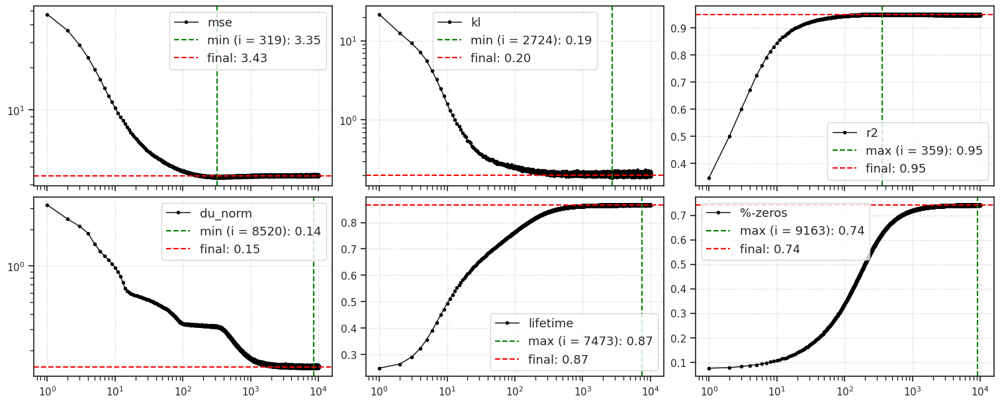

CPU times: user 3min 2s, sys: 21.9 s, total: 3min 24s
Wall time: 3min 29s


In [6]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=5,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [7]:
kws = dict(
    seq_total=10000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [01:26<00:00, 43.24s/it]


In [8]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [27]:
clf = LogisticRegression(C=1.0).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [28]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.8687

In [16]:
true = tonp(tr.dl_vld.dataset.tensors[1])

accu = {}
for c in [1e-2, 1e-1, 5e-1, 1, 5, 50, 1e2, 1e5]:
    clf = LogisticRegression(C=c).fit(
        lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))
    pred = clf.predict(lamb['vld'])
    report = classification_report(true, pred, output_dict=True)
    accu[c] = report['accuracy']

In [17]:
print(accu)

{0.01: 0.8686, 0.1: 0.8686, 0.5: 0.8687, 1: 0.8687, 5: 0.8687, 50: 0.8687, 100.0: 0.8687, 100000.0: 0.8687}

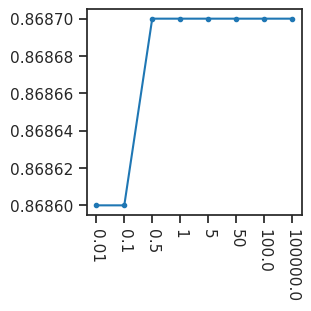

In [26]:
fig, ax = create_figure(1, 1, (3, 3))
ax.plot(list(accu.values()), marker='.')
ax.set(xticks=range(len(accu)), xticklabels=list(accu))
ax.tick_params(axis='x', rotation=-90)
plt.show()

## (128, 256.0)

In [23]:
a = 'poisson_FashionMNIST_t-128_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep400-lr(0.0005)_beta(256:0.1)_temp(0.01:0.5)_gr(2000)_(2025_03_14,19:01)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

400

In [24]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.0205], device='cuda:2', grad_fn=<ExpBackward0>),)

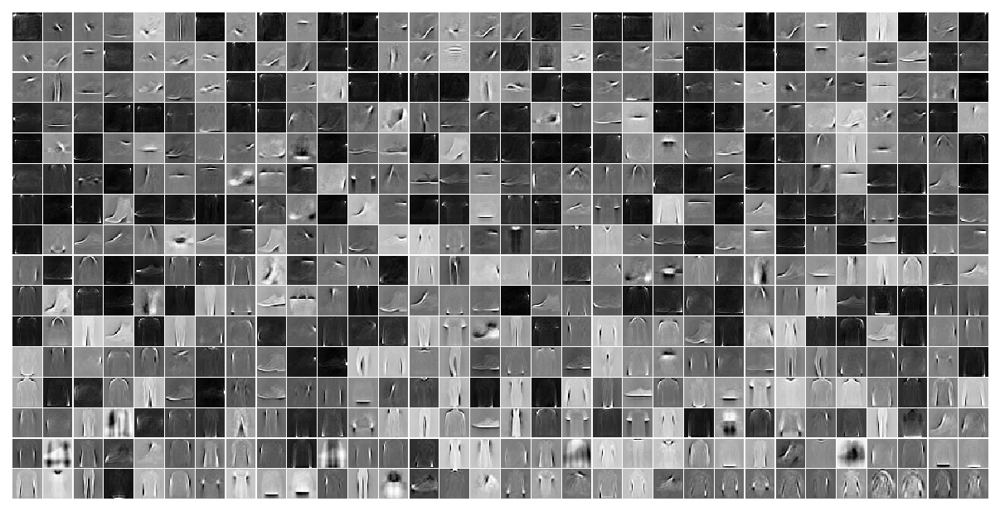

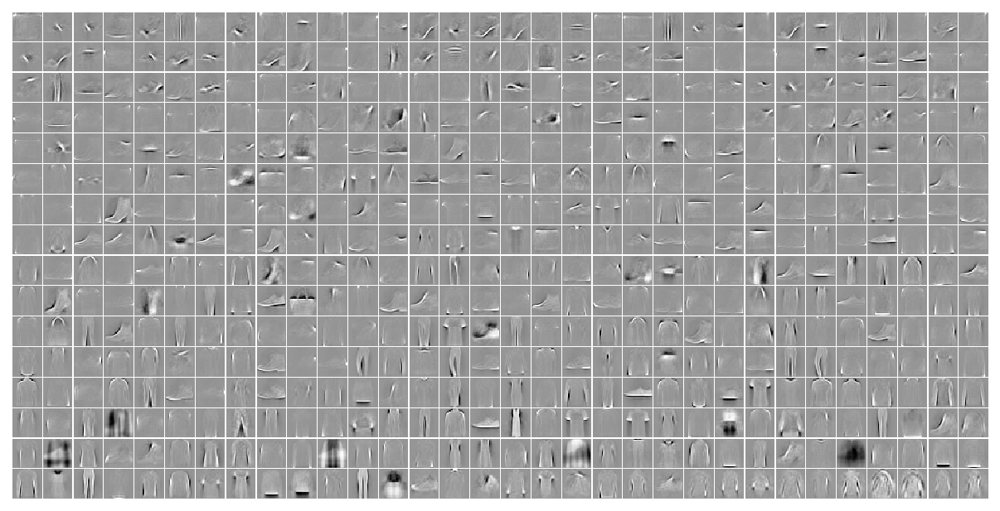

In [25]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 2/2 [00:55<00:00, 27.53s/it]


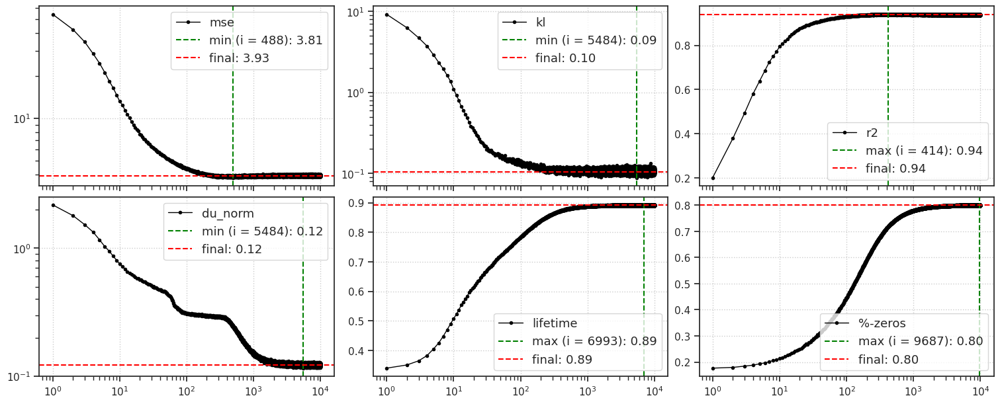

CPU times: user 1min 3s, sys: 4.13 s, total: 1min 7s
Wall time: 1min 7s


In [26]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=2,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [27]:
kws = dict(
    seq_total=1000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


In [28]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [34]:
clf = LogisticRegression(C=5).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [35]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.8735

In [31]:
true = tonp(tr.dl_vld.dataset.tensors[1])

accu = {}
for c in [1e-2, 1e-1, 5e-1, 1, 5, 50, 1e2, 1e5]:
    clf = LogisticRegression(C=c).fit(
        lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))
    pred = clf.predict(lamb['vld'])
    report = classification_report(true, pred, output_dict=True)
    accu[c] = report['accuracy']

In [32]:
print(accu)

{0.01: 0.8721, 0.1: 0.8724, 0.5: 0.8726, 1: 0.8729, 5: 0.8735, 50: 0.8729, 100.0: 0.8725, 100000.0: 0.8724}

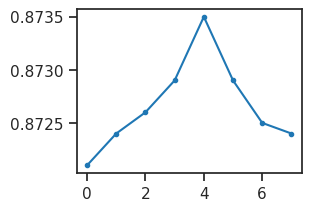

In [33]:
fig, ax = create_figure()
ax.plot(list(accu.values()), marker='.')
plt.show()

## (128, 512.0)

In [36]:
a = 'poisson_FashionMNIST_t-128_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep400-lr(0.0005)_beta(512:0.1)_temp(0.01:0.5)_gr(2000)_(2025_03_14,19:01)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

400

In [37]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.0136], device='cuda:2', grad_fn=<ExpBackward0>),)

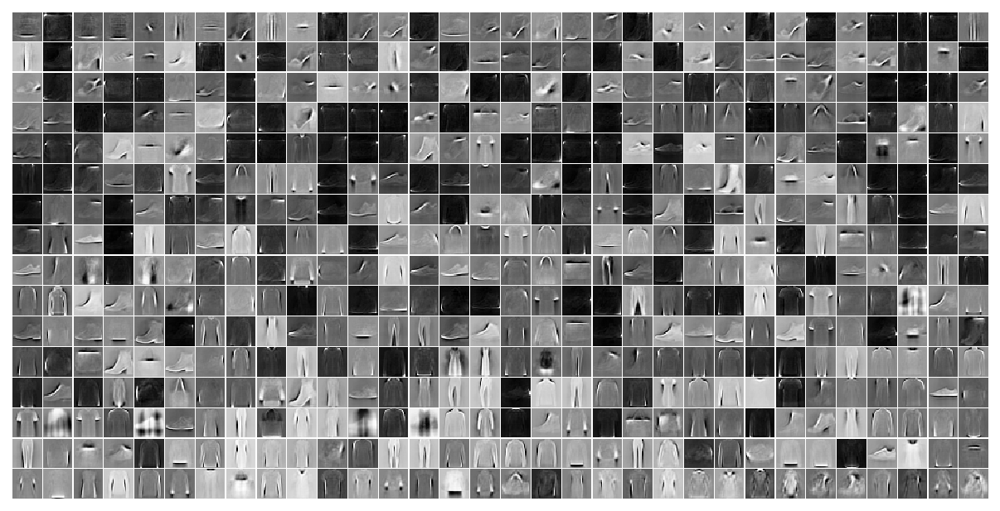

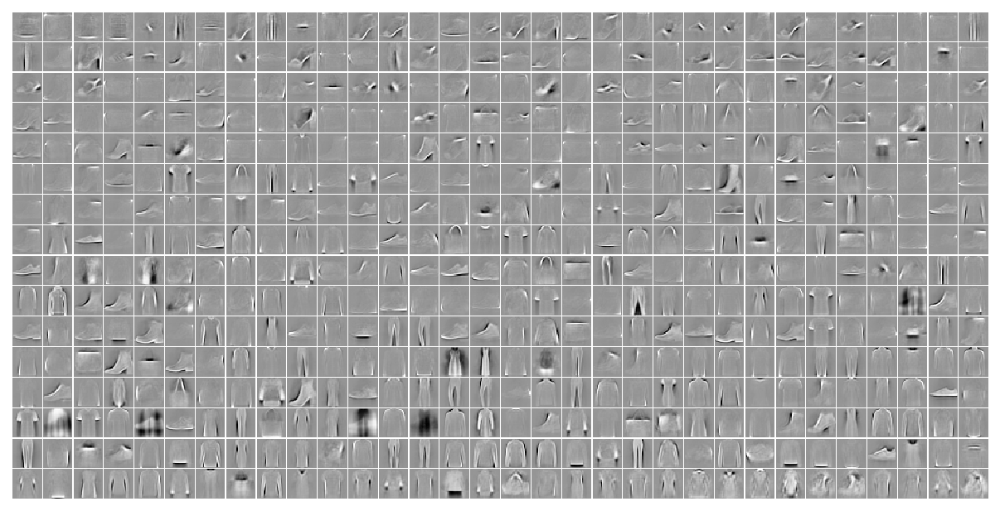

In [38]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 2/2 [00:55<00:00, 27.50s/it]


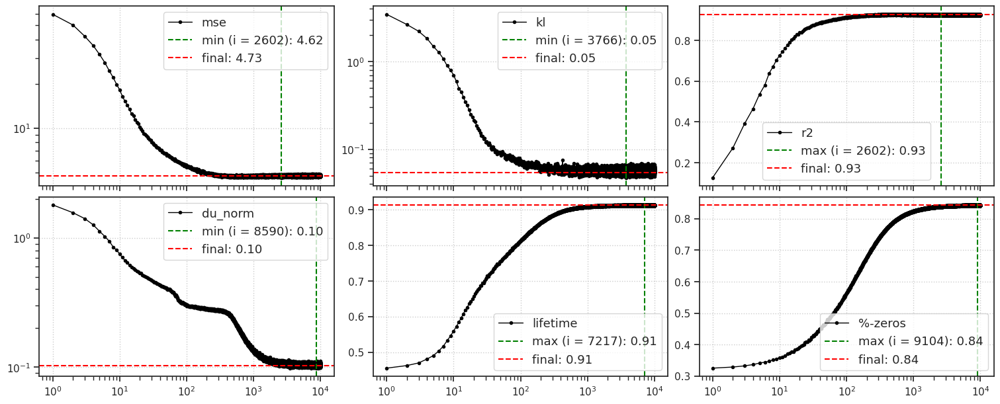

CPU times: user 1min 3s, sys: 3.66 s, total: 1min 6s
Wall time: 1min 6s


In [39]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=2,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [40]:
kws = dict(
    seq_total=1000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


In [41]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [47]:
clf = LogisticRegression(C=1e-2).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [48]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.8717

In [44]:
true = tonp(tr.dl_vld.dataset.tensors[1])

accu = {}
for c in [1e-2, 1e-1, 5e-1, 1, 5, 50, 1e2, 1e5]:
    clf = LogisticRegression(C=c).fit(
        lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))
    pred = clf.predict(lamb['vld'])
    report = classification_report(true, pred, output_dict=True)
    accu[c] = report['accuracy']

In [45]:
print(accu)

{0.01: 0.8717, 0.1: 0.8713, 0.5: 0.8708, 1: 0.8715, 5: 0.8712, 50: 0.8712, 100.0: 0.8716, 100000.0: 0.8712}

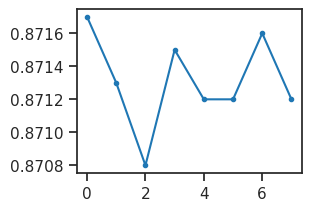

In [46]:
fig, ax = create_figure()
ax.plot(list(accu.values()), marker='.')
plt.show()

## (128, 64.0) -- This was incomplete

Amazingly, with only 30 epochs this does well

In [3]:
a = 'poisson_FashionMNIST_t-128_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep200-lr(8e-05)_beta(64:0.1)_temp(0.01:0.5)_gr(2000)_(2025_03_14,10:41)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

30

In [4]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.3361], device='cuda:2', grad_fn=<ExpBackward0>),)

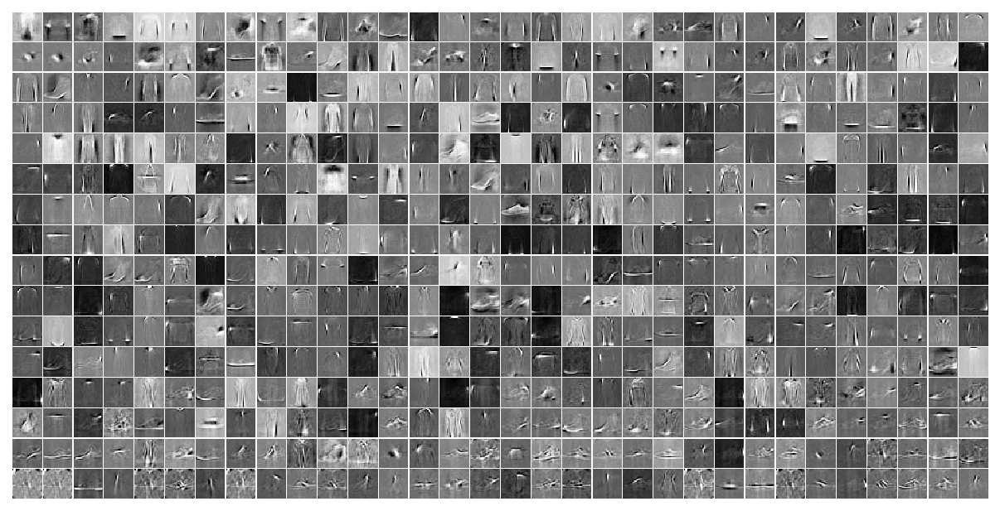

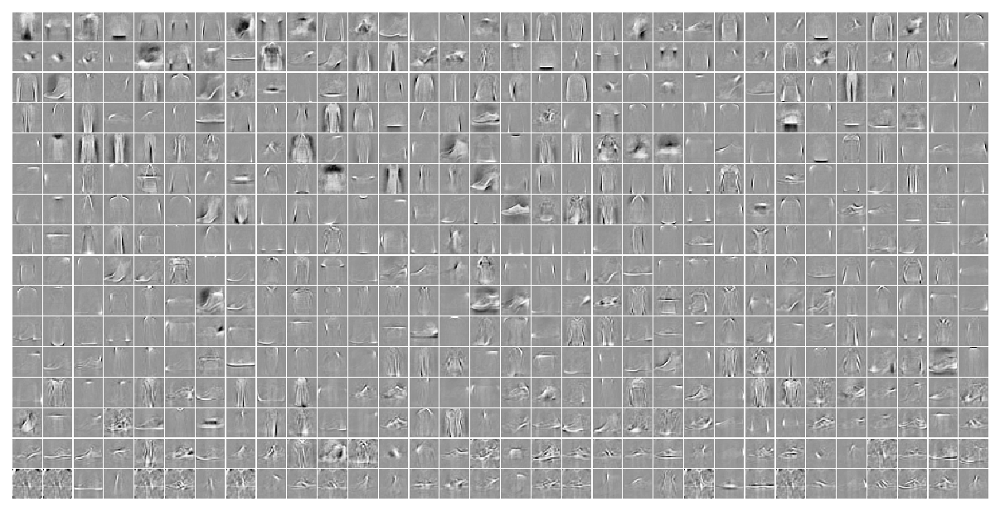

In [5]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 2/2 [01:06<00:00, 33.36s/it]


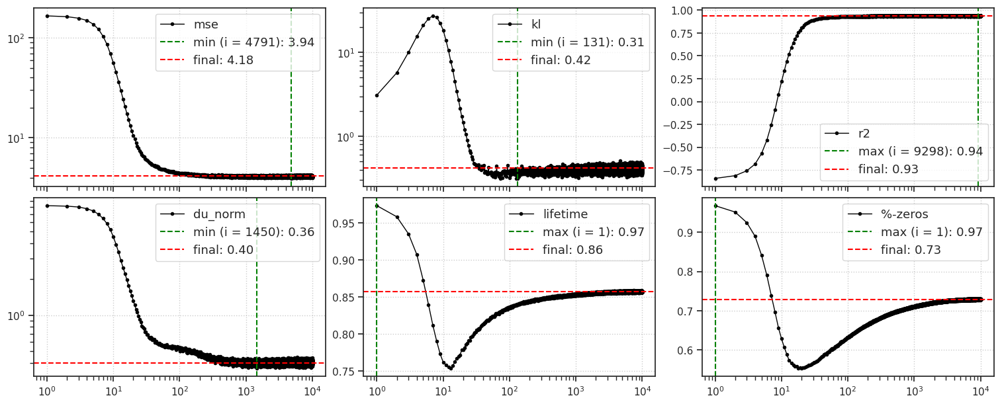

CPU times: user 1min 10s, sys: 4.29 s, total: 1min 14s
Wall time: 1min 19s


In [6]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=2,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [25]:
kws = dict(
    seq_total=1000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [00:07<00:00,  3.64s/it]


In [26]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [48]:
clf = LogisticRegression(C=1e6).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [49]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.8721

In [45]:
true = tonp(tr.dl_vld.dataset.tensors[1])

accu = {}
for c in [1e-2, 1e-1, 1, 1e2, 1e5, 1e7, 1e10]:
    clf = LogisticRegression(C=c).fit(
        lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))
    pred = clf.predict(lamb['vld'])
    report = classification_report(true, pred, output_dict=True)
    accu[c] = report['accuracy']

In [46]:
print(accu)

{0.01: 0.8711, 0.1: 0.8718, 1: 0.8713, 100.0: 0.8716, 100000.0: 0.8721, 10000000.0: 0.8721, 10000000000.0: 0.8721}

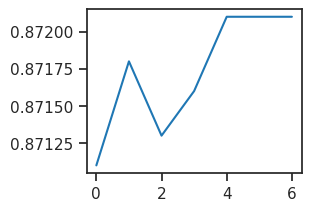

In [47]:
fig, ax = create_figure()
ax.plot(list(accu.values()))

## (128, 96.0) -- This was incomplete

In [12]:
a = 'poisson_FashionMNIST_t-128_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep200-lr(8e-05)_beta(96:0.1)_temp(0.01:0.5)_gr(2000)_(2025_03_14,10:41)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

30

In [13]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.3303], device='cuda:2', grad_fn=<ExpBackward0>),)

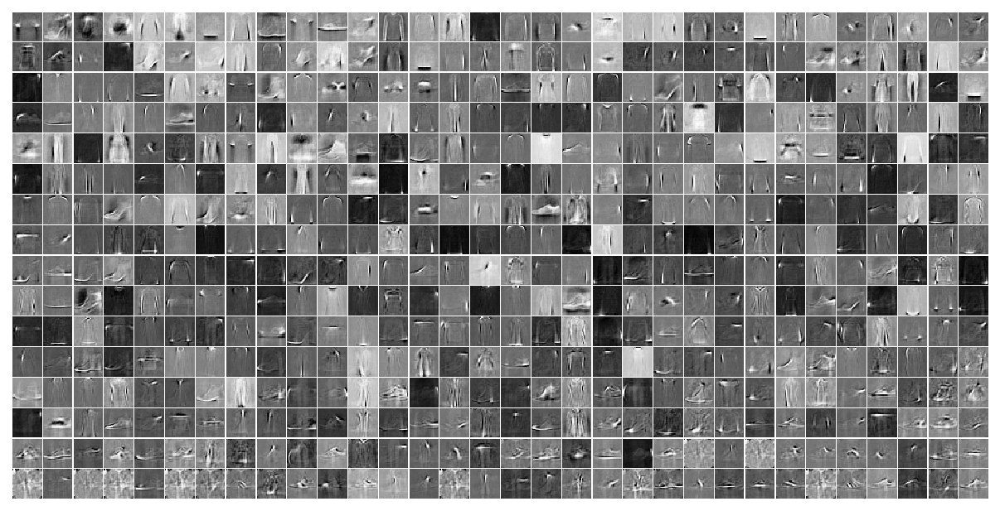

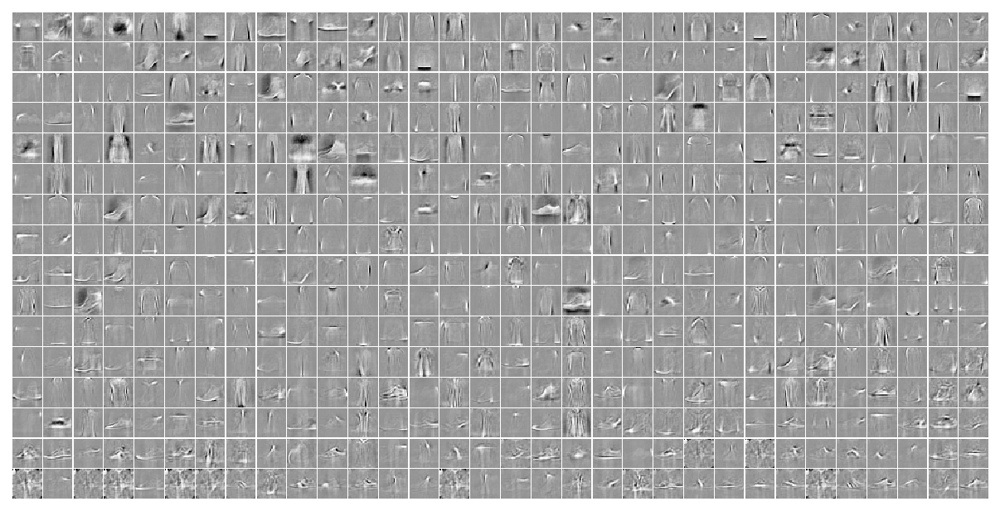

In [14]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 2/2 [00:53<00:00, 26.71s/it]


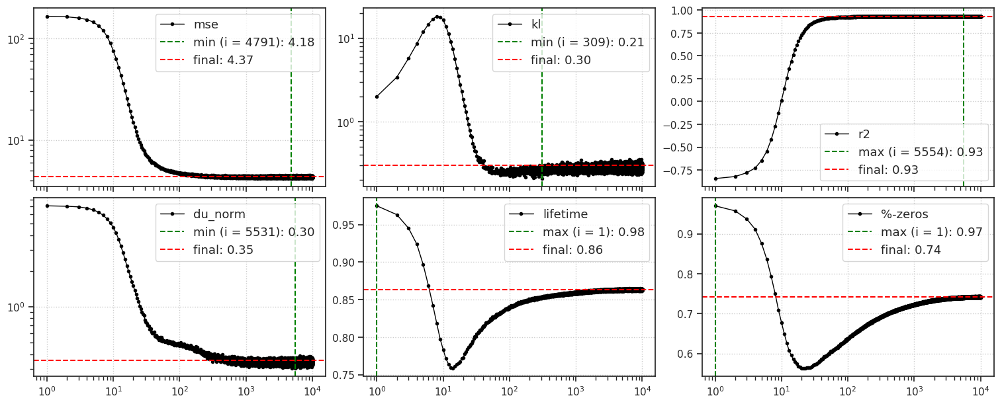

CPU times: user 1min 2s, sys: 3.71 s, total: 1min 5s
Wall time: 1min 5s


In [15]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=2,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [16]:
kws = dict(
    seq_total=1000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [00:06<00:00,  3.04s/it]


In [17]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [18]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [19]:
clf = LogisticRegression(C=1.0).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [20]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.8738

## (128, 128.0) -- This was incomplete

In [3]:
a = 'poisson_FashionMNIST_t-128_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep200-lr(8e-05)_beta(128:0.1)_temp(0.01:0.5)_gr(2000)_(2025_03_14,10:40)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

30

In [4]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.3269], device='cuda:2', grad_fn=<ExpBackward0>),)

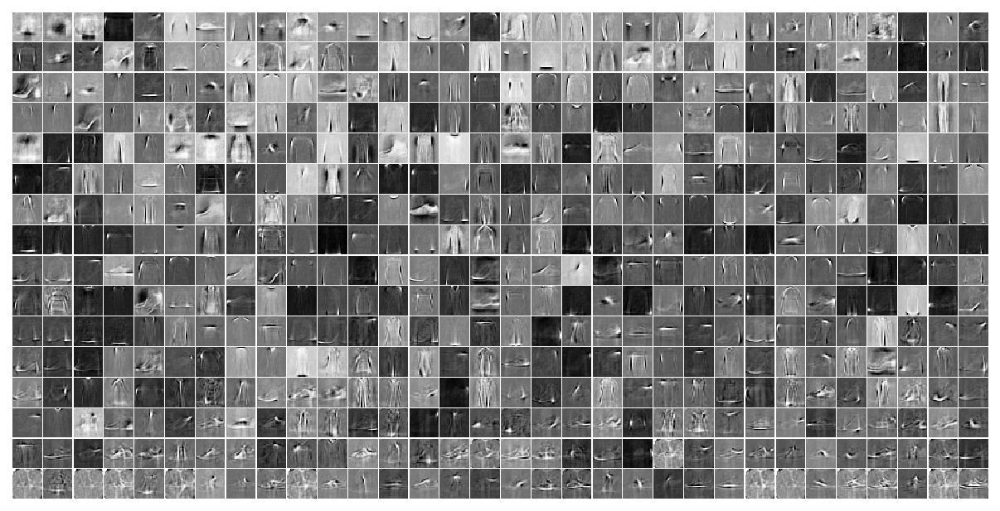

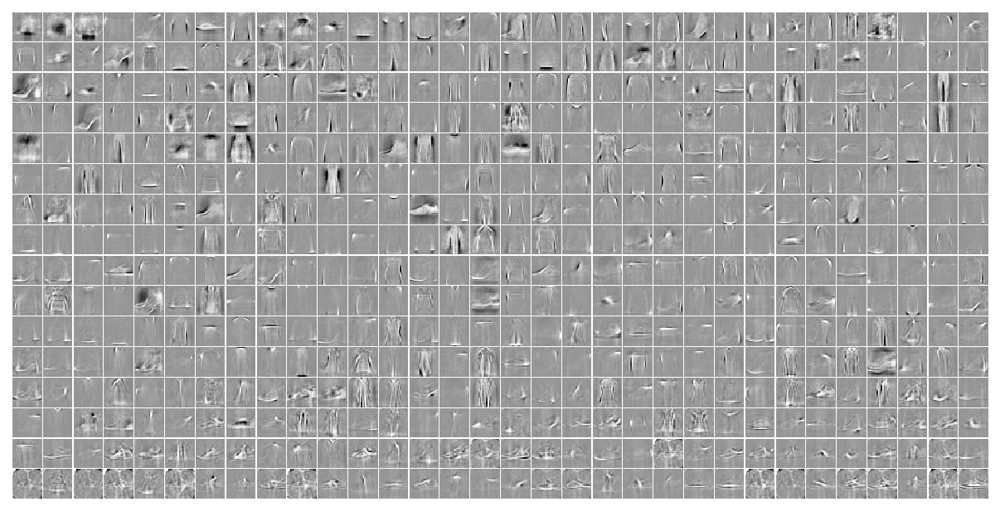

In [5]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 2/2 [00:56<00:00, 28.27s/it]


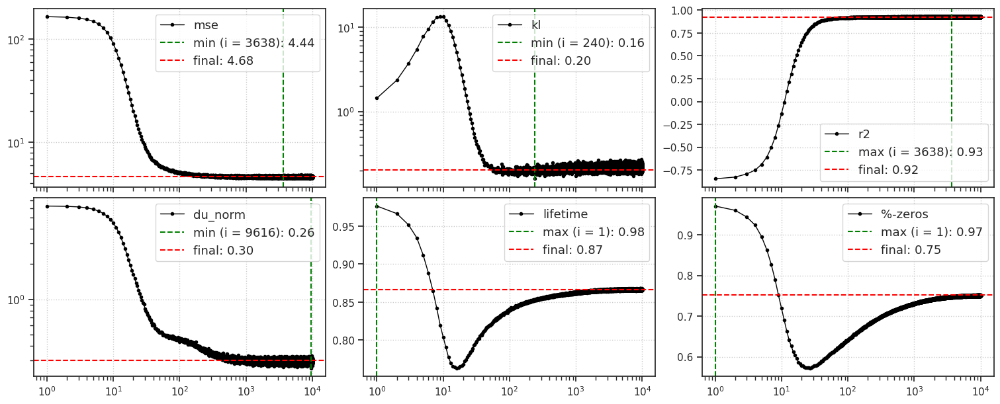

CPU times: user 1min, sys: 3.95 s, total: 1min 4s
Wall time: 1min 8s


In [6]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=2,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [7]:
kws = dict(
    seq_total=1000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


In [8]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [9]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [10]:
clf = LogisticRegression(C=1.0).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [11]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.8764

## (32, 32.0)

In [3]:
a = 'poisson_FashionMNIST_t-32_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep200-lr(8e-05)_beta(32:0.1)_temp(0.01:0.5)_gr(1000)_(2025_03_13,21:34)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

200

In [4]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.0232], device='cuda:2', grad_fn=<ExpBackward0>),)

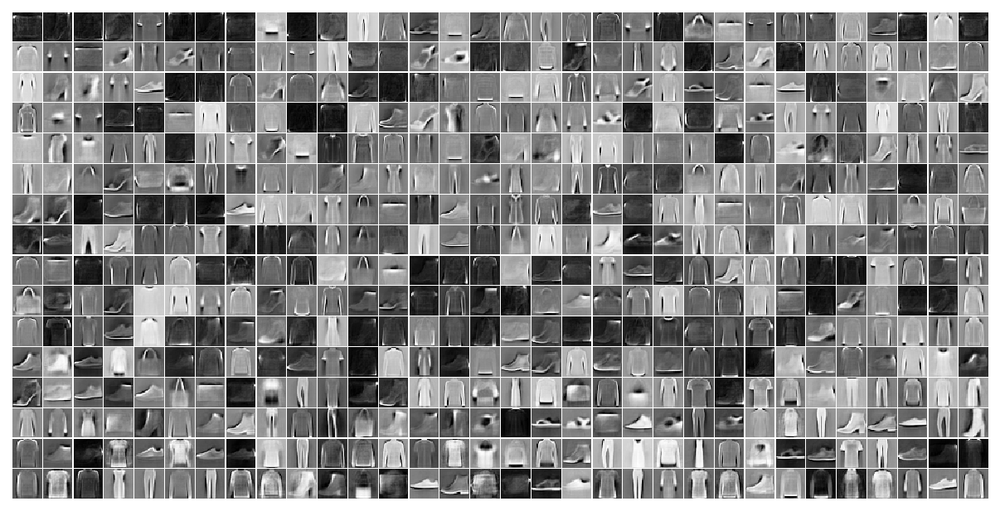

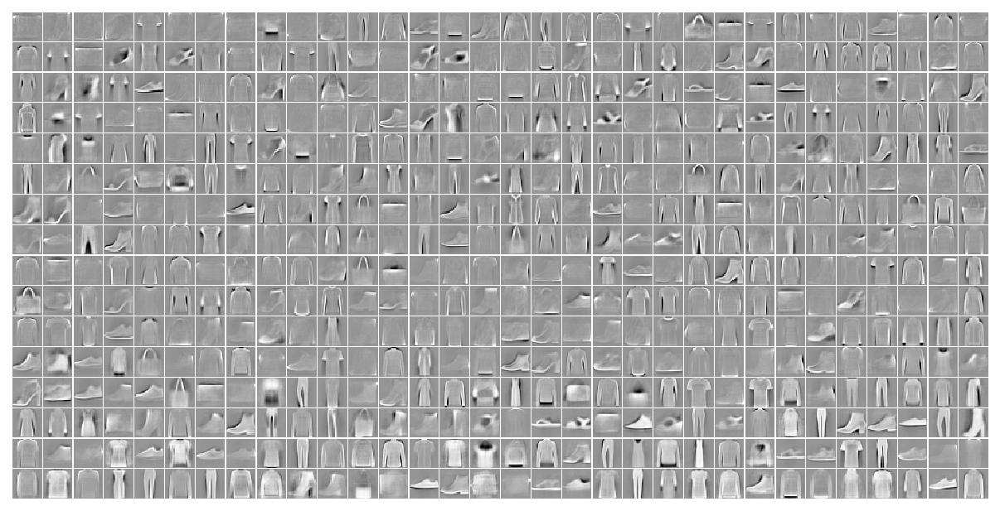

In [5]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 2/2 [01:01<00:00, 30.61s/it]


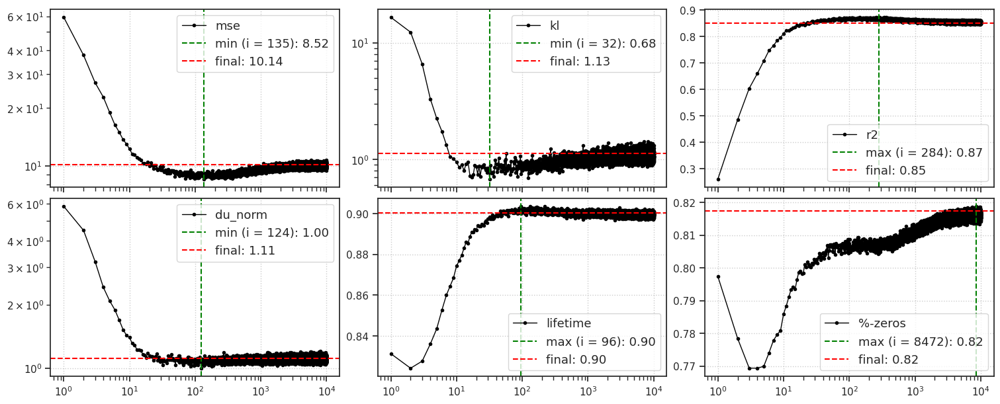

CPU times: user 1min 5s, sys: 4.29 s, total: 1min 10s
Wall time: 1min 14s


In [6]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=2,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [7]:
kws = dict(
    seq_total=1000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


In [8]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [9]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [10]:
clf = LogisticRegression(C=1.0).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [11]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.871

## (64, 64.0)

In [12]:
a = 'poisson_FashionMNIST_t-64_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep200-lr(8e-05)_beta(64:0.1)_temp(0.01:0.5)_gr(1000)_(2025_03_13,21:34)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

200

In [13]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.0213], device='cuda:2', grad_fn=<ExpBackward0>),)

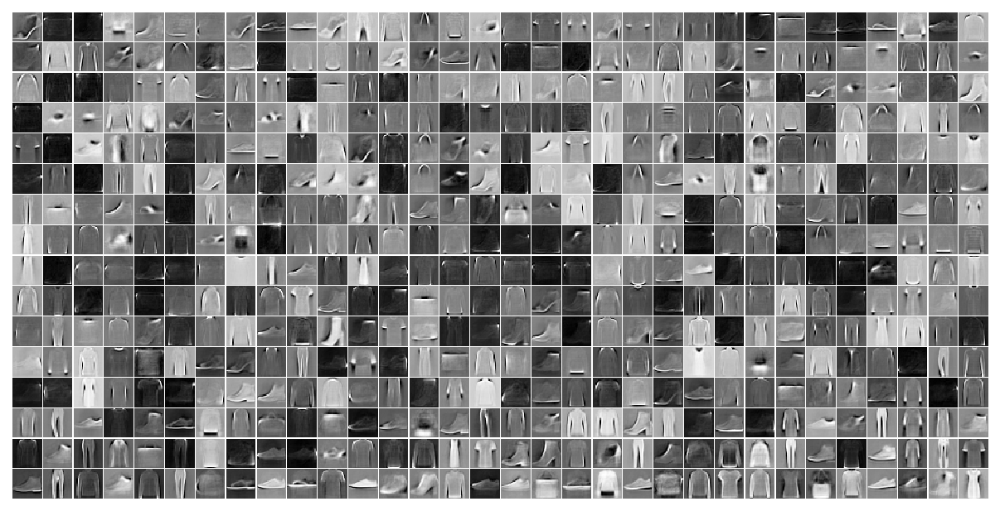

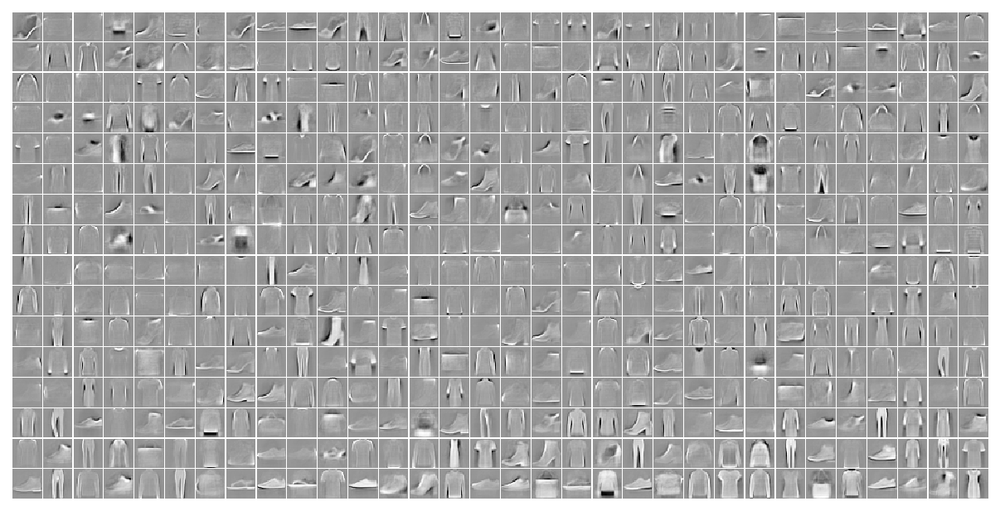

In [14]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 2/2 [00:54<00:00, 27.24s/it]


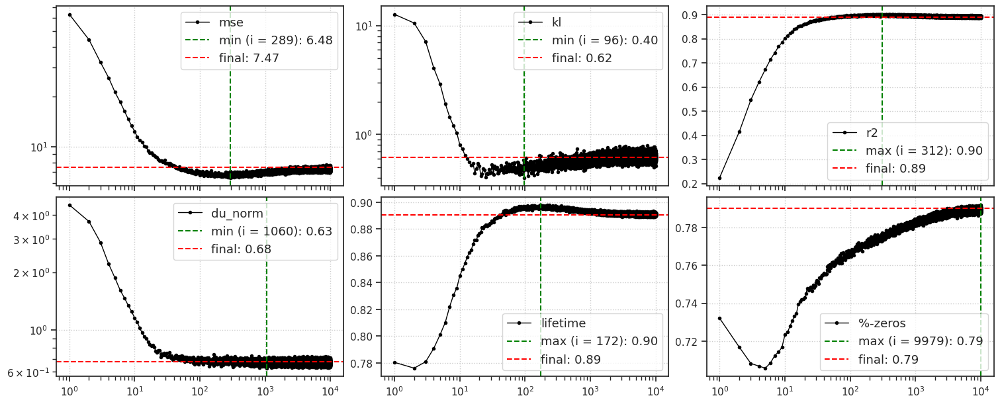

CPU times: user 1min 2s, sys: 3.89 s, total: 1min 6s
Wall time: 1min 6s


In [15]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=2,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [16]:
kws = dict(
    seq_total=1000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [00:06<00:00,  3.47s/it]


In [17]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [18]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [19]:
clf = LogisticRegression(C=1.0).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [20]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.8711

## (64, 128.0)

In [21]:
a = 'poisson_FashionMNIST_t-64_z-[512]_u-10,du-10_<grad|lin>_seed-1'
b = 'b100-ep200-lr(8e-05)_beta(128:0.1)_temp(0.01:0.5)_gr(1000)_(2025_03_13,21:33)'
tr, meta = load_model(f"{a}/{b}", device)
meta['checkpoint']

200

In [22]:
tuple(llr.exp() for llr in tr.model.layer.log_lr)

(tensor([0.0159], device='cuda:2', grad_fn=<ExpBackward0>),)

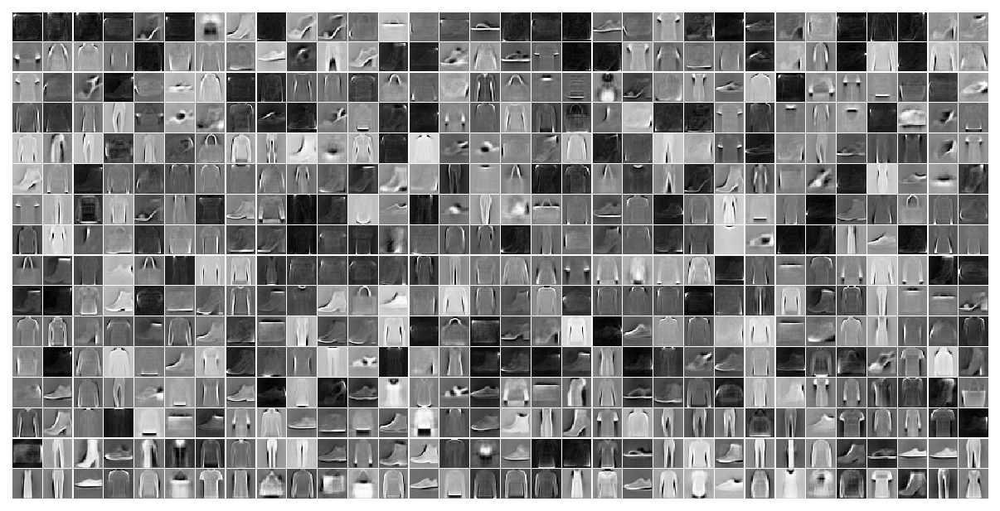

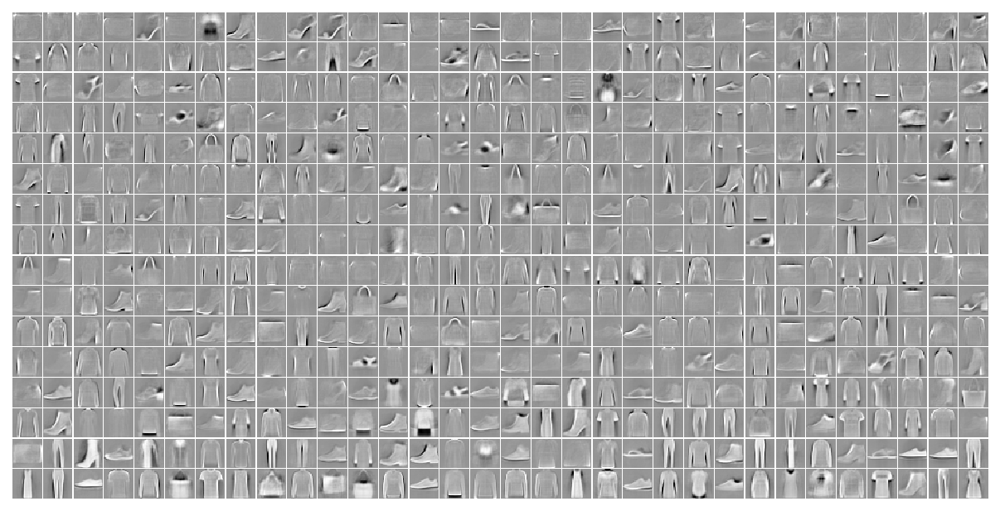

In [23]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150)
tr.model.show(order=np.argsort(u0), nrows=16, dpi=150, method='abs-max');

100%|███████████████████████████████████| 2/2 [00:54<00:00, 27.22s/it]


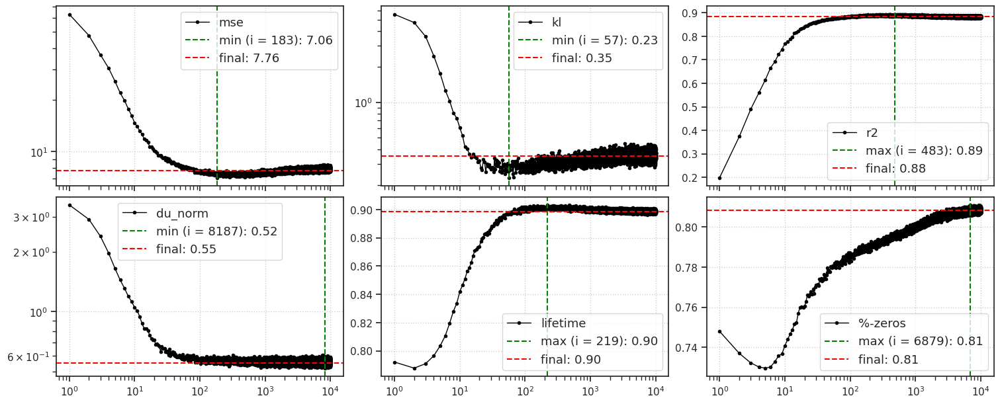

CPU times: user 1min 2s, sys: 3.83 s, total: 1min 6s
Wall time: 1min 6s


In [24]:
%%time

kws = dict(
    seq_total=10000,
    seq_batch_sz=1000,
    n_data_batches=2,
    compute_sprs=True,
)
results = tr.analysis('vld', **kws)
_ = plot_convergence(results, color='k')

### clf

In [25]:
kws = dict(
    seq_total=1000,
    seq_batch_sz=100,
    data_batch_sz=5000,
    verbose=True,
)
results = {
    name: tr.xtract_ftr(name, **kws)
    for name in ['trn', 'vld']
}

100%|███████████████████████████████████| 2/2 [00:07<00:00,  3.57s/it]


In [26]:
lamb = {k: np.exp(d['state'][:, -1]) for k, d in results.items()}

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [28]:
clf = LogisticRegression(C=1.0).fit(
    lamb['trn'], tonp(tr.dl_trn.dataset.tensors[1]))

pred = clf.predict(lamb['vld'])
true = tonp(tr.dl_vld.dataset.tensors[1])

In [29]:
report = classification_report(true, pred, output_dict=True)
report['accuracy']

0.8713